In [1]:
import sys
sys.path.append('../')
import gc
import jax
import jax.numpy as jnp
import numpy as np
from lucid.AbsorptionSIREN.siren_train import train, target_fn, train_injector, train_injector_random
from lucid.AbsorptionSIREN.siren_loader import setup_siren, save_siren_params, load_siren_params, make_absorption_fn
from lucid.AbsorptionSIREN.visualize_3d import plot_interactive_plotly, plot_interactive_comparison, plot_rz_heatmap, compute_chi_square

JAX compilation (first step)...
  Compilation in 3.6s

  Step         Train      Train L2        Val L2    Time (s)
────────────────────────────────────────────────────────────
     0     0.3980941     0.5235941     0.5484938       0.008s
   100     0.0139714     0.0417271     0.0180765       0.005s
   200     0.0047795     0.0114808     0.0084992       0.005s
   300     0.0032963     0.0068942     0.0052215       0.004s
   400     0.0025840     0.0054250     0.0044073       0.004s
   500     0.0021337     0.0041837     0.0028421       0.004s
   600     0.0018906     0.0039367     0.0024779       0.004s
   700     0.0013172     0.0029320     0.0018876       0.005s
   800     0.0010560     0.0028793     0.0018337       0.005s
   900     0.0008034     0.0018369     0.0013622       0.005s
  1000     0.0005965     0.0020687     0.0014083       0.005s
  1100     0.0009226     0.0020565     0.0015867       0.005s
  1200     0.0003598     0.0011148     0.0011415       0.004s
  1300     0.0002

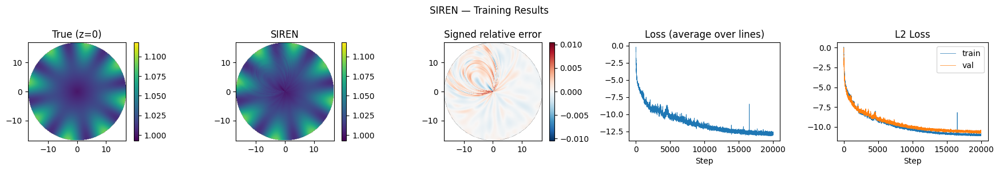

In [2]:
# Create a params file

params = train(
    n_steps=20000,
    n_lines=1000,
    n_pts_per_line=20,
    lr=5e-4,
    seed=0,
    output_path="../lucid/AbsorptionSIREN/true_siren_params.npz",
    plot=True,
)

#save_siren_params(params, "siren_params.npz")

[siren_loader] Parameters loaded from ../lucid/AbsorptionSIREN/siren_params4.npz
[1.3093393]


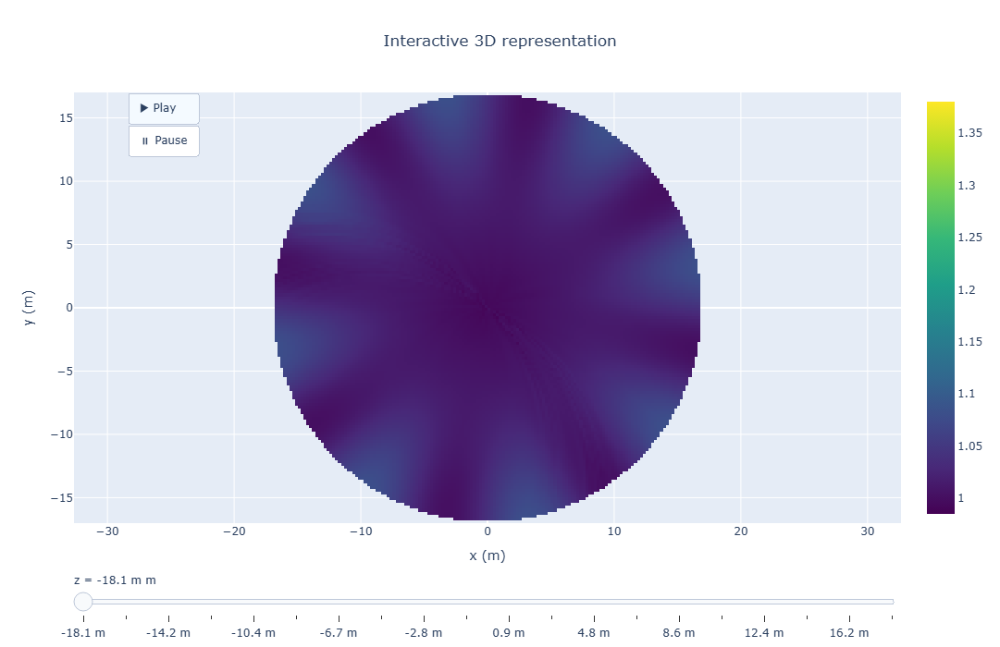

In [3]:
model, params = setup_siren("../lucid/AbsorptionSIREN/siren_params4.npz")
absorption_fn = make_absorption_fn(model)
print(absorption_fn(jnp.array([[16.0, 0.0, 17.0]]), params))
plot_interactive_plotly(lambda x: absorption_fn(x, params))

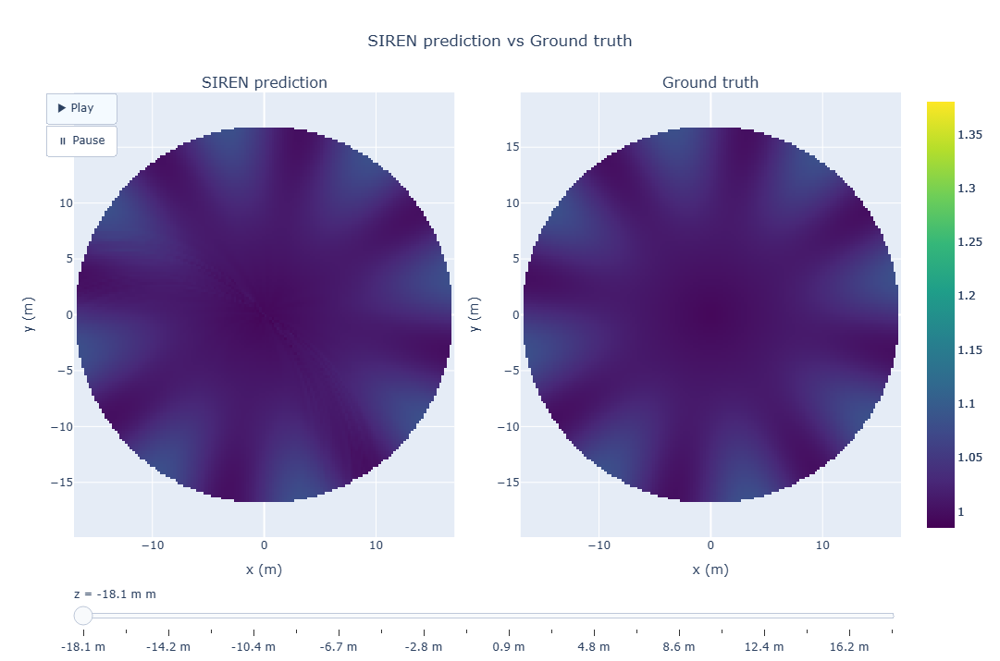

In [4]:
plot_interactive_comparison(lambda x: absorption_fn(x, params), target_fn)

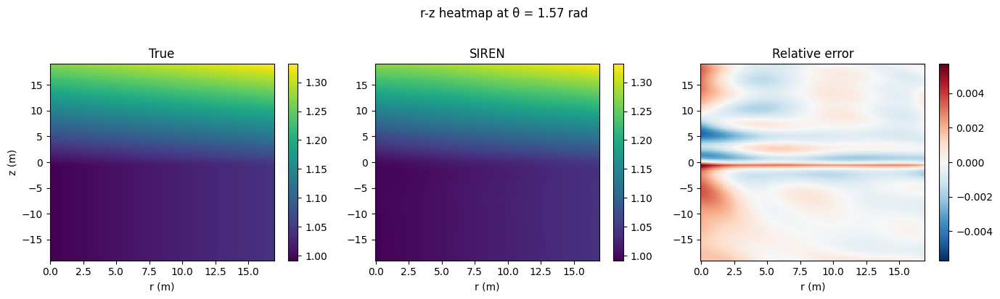

In [5]:
plot_rz_heatmap(model, params, target_fn)

In [6]:
results = compute_chi_square(lambda x: absorption_fn(x, params), target_fn)

χ²                = 6.8966
χ²/N (reduced)    = 0.000020
N points          = 348400
RMSE              = 0.004935
Mean relative err = 0.2801%


JAX compilation (first step)...
  Done in 0.7s

  Step         Train      Train L2        Val L2      Time
──────────────────────────────────────────────────────────
     0     0.4196222     0.2229977     0.2590872    0.001s
   100     0.0007271     0.0102805     0.0266566    0.001s
   200     0.0003058     0.0040720     0.0126621    0.001s
   300     0.0001693     0.0021083     0.0126859    0.001s
   400     0.0001670     0.0010549     0.0064304    0.001s
   500     0.0000417     0.0008363     0.0087833    0.001s
   600     0.0001591     0.0007564     0.0110144    0.001s
   700     0.0001075     0.0006524     0.0095197    0.001s
   800     0.0000714     0.0004857     0.0072408    0.001s
   900     0.0000402     0.0003805     0.0061526    0.001s
  1000     0.0000455     0.0003874     0.0116457    0.001s
  1100     0.0000429     0.0003187     0.0082480    0.001s
  1200     0.0000604     0.0003870     0.0068799    0.001s
  1300     0.0000331     0.0003408     0.0077220    0.001s
  1400  

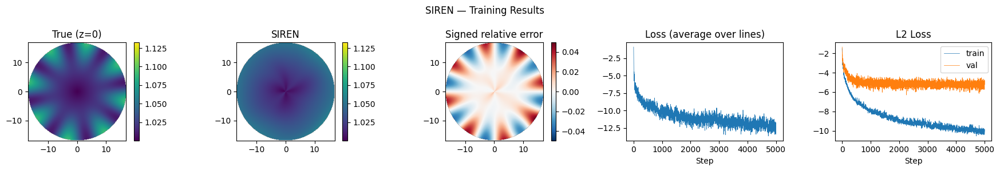

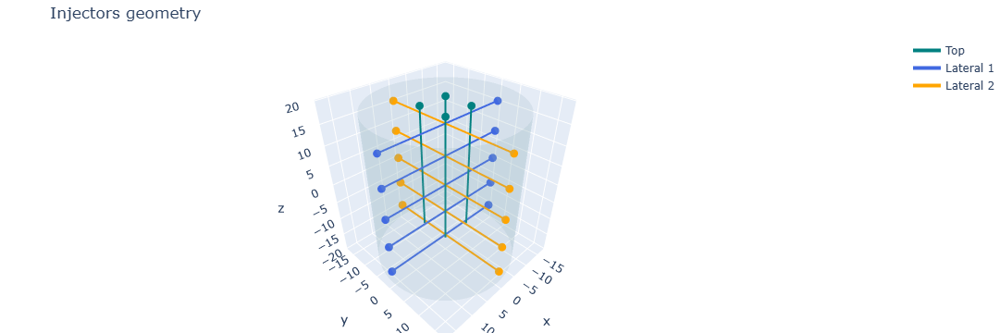

In [5]:
params = train_injector(
    n_steps=5000,
    n_pts_per_line=20,
    lr=5e-5,
    seed=0,
    output_path="../lucid/AbsorptionSIREN/siren_params_injector2.npz",
    plot=True,
)


[siren_loader] Parameters loaded from ../lucid/AbsorptionSIREN/siren_params_injector2.npz
[1.2828712]


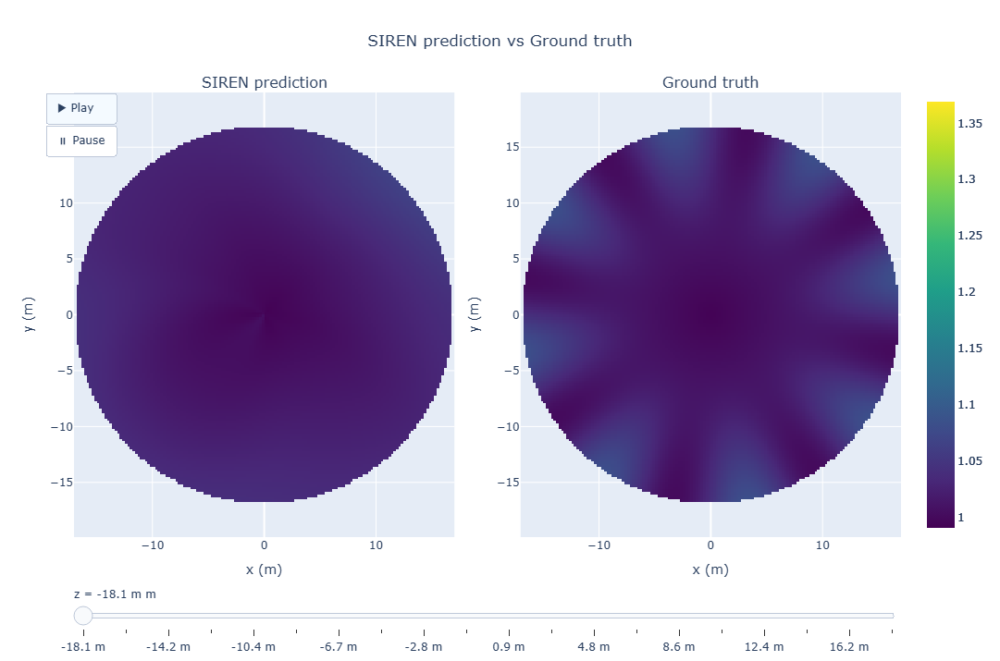

In [6]:
model, params = setup_siren("../lucid/AbsorptionSIREN/siren_params_injector2.npz")
absorption_fn = make_absorption_fn(model)
print(absorption_fn(jnp.array([[16.0, 0.0, 17.0]]), params))
plot_interactive_comparison(lambda x: absorption_fn(x, params), target_fn)

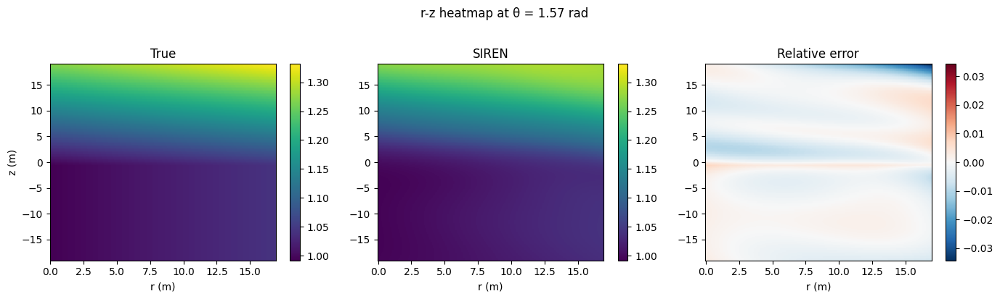

In [8]:
plot_rz_heatmap(model, params, target_fn)

In [7]:
results = compute_chi_square(lambda x: absorption_fn(x, params), target_fn)

χ²                = 108.3757
χ²/N (reduced)    = 0.000311
N points          = 348400
RMSE              = 0.018739
Mean relative err = 1.2112%


JAX compilation (first step)...
  Done in 0.9s

  Step         Train      Train L2        Val L2      Time
──────────────────────────────────────────────────────────
     0     0.4096242     0.2065615     0.2436132    0.001s
   100     0.0019775     0.0104834     0.0204654    0.001s
   200     0.0004299     0.0064047     0.0122426    0.001s
   300     0.0005371     0.0047778     0.0116022    0.001s
   400     0.0014124     0.0055449     0.0127984    0.001s
   500     0.0006447     0.0050437     0.0083521    0.001s
   600     0.0003903     0.0044470     0.0121532    0.001s
   700     0.0004447     0.0046202     0.0106246    0.001s
   800     0.0003709     0.0044948     0.0086366    0.001s
   900     0.0003811     0.0044807     0.0080324    0.001s
  1000     0.0002698     0.0032618     0.0107786    0.001s
  1100     0.0002412     0.0035384     0.0098715    0.001s
  1200     0.0003383     0.0033259     0.0094702    0.001s
  1300     0.0002429     0.0035416     0.0108234    0.001s
  1400  

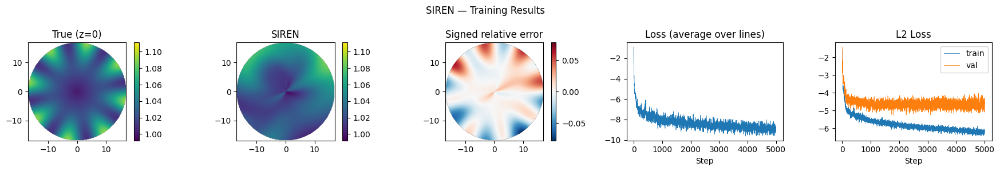

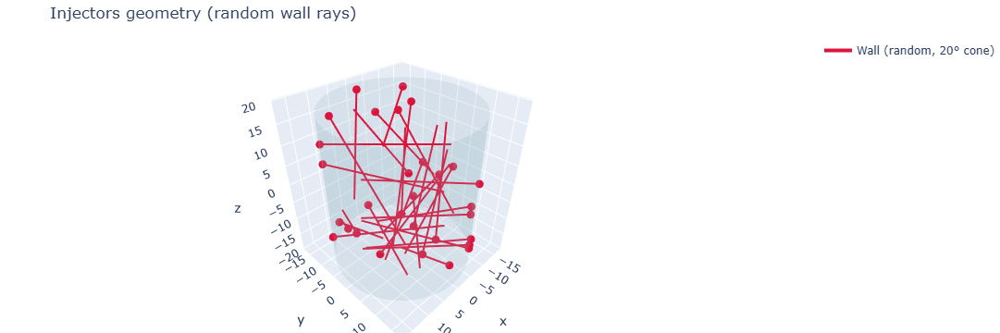

In [3]:
params = train_injector_random(
    n_steps=5000,
    n_pts_per_line=20,
    lr=5e-5,
    seed=0,
    output_path="../lucid/AbsorptionSIREN/siren_params_injector_random.npz",
    plot=True,
)


[siren_loader] Parameters loaded from ../lucid/AbsorptionSIREN/siren_params_injector_random.npz
[1.2309519]


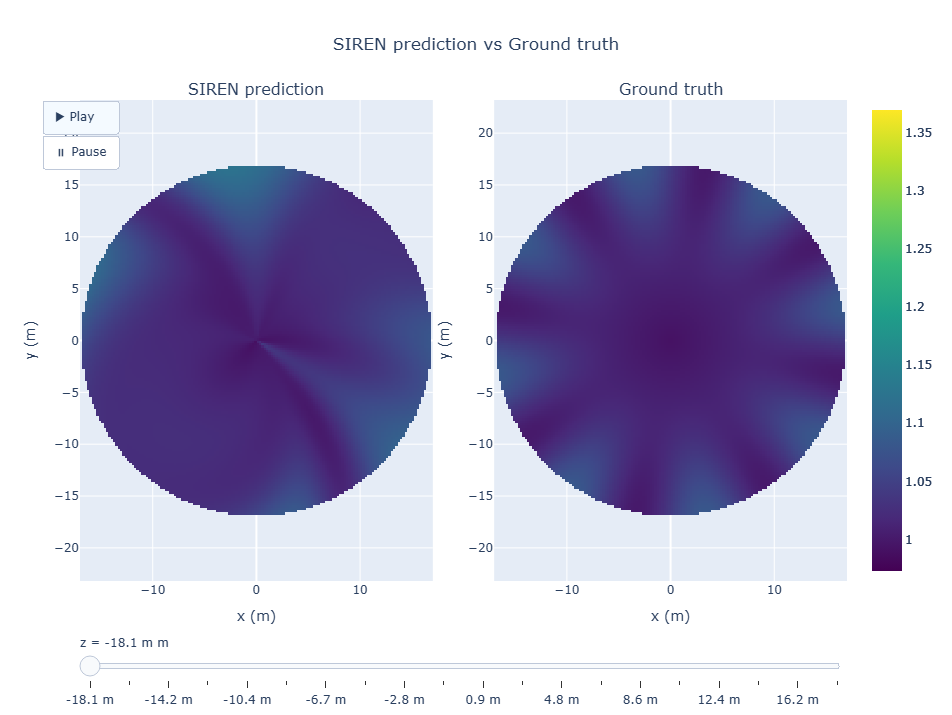

In [4]:
model, params = setup_siren("../lucid/AbsorptionSIREN/siren_params_injector_random.npz")
absorption_fn = make_absorption_fn(model)
print(absorption_fn(jnp.array([[16.0, 0.0, 17.0]]), params))
plot_interactive_comparison(lambda x: absorption_fn(x, params), target_fn)

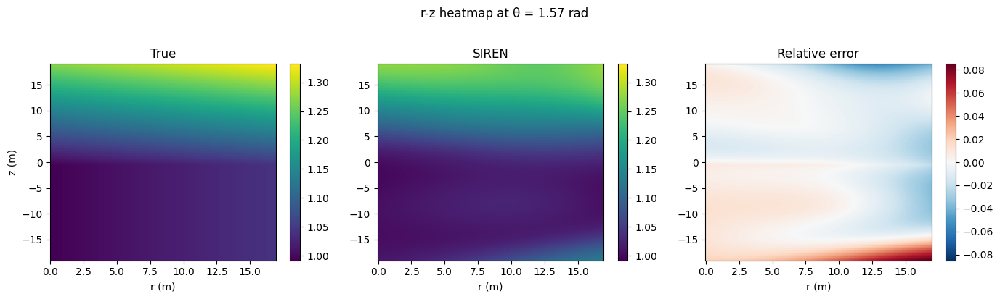

In [5]:
plot_rz_heatmap(model, params, target_fn)

In [6]:
results = compute_chi_square(lambda x: absorption_fn(x, params), target_fn)

χ²                = 176.3738
χ²/N (reduced)    = 0.000506
N points          = 348400
RMSE              = 0.023949
Mean relative err = 1.4782%
